# 「日本で最も丸い湖」を探す 💧👌


[国土数値情報 | 湖沼データ](https://nlftp.mlit.go.jp/ksj/gml/datalist/KsjTmplt-W09-v2_2.html)


In [60]:
import math

import pandas as pd
import geopandas as gpd
import altair as alt

## 準備


### 国土数値情報: 行政区域コード


In [61]:
df_admin = pd.read_excel(
    "./data/国土数値情報/行政区域コード/AdminiBoundary_CD.xlsx", skiprows=2
)
df_admin

,行政区域コード,都道府県名\n（漢字）,市区町村名\n（漢字）,都道府県名\n（ｶﾅ）,市区町村名\n（ｶﾅ）,コードの改定区分,改正年月日,改正後のコード,改正後の名称,改正後の名称\n(ｶﾅ),改正事由等
0,1000,北海道,NaN,ﾎｯｶｲﾄﾞｳ,NaN,NaN,NaN,1000,NaN,NaN,NaN
1,1100,北海道,札幌市,ﾎｯｶｲﾄﾞｳ,ｻｯﾎﾟﾛｼ,NaN,NaN,1100,NaN,NaN,NaN
2,1101,北海道,札幌市中央区,ﾎｯｶｲﾄﾞｳ,ｻｯﾎﾟﾛｼﾁｭｳｵｳｸ,NaN,NaN,1101,NaN,NaN,NaN
3,1102,北海道,札幌市北区,ﾎｯｶｲﾄﾞｳ,ｻｯﾎﾟﾛｼｷﾀｸ,NaN,NaN,1102,NaN,NaN,NaN
4,1103,北海道,札幌市東区,ﾎｯｶｲﾄﾞｳ,ｻｯﾎﾟﾛｼﾋｶﾞｼｸ,NaN,NaN,1103,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2943,47373,沖縄県,上野村,ｵｷﾅﾜｹﾝ,ｳｴﾉｿﾝ,欠番,2005-10-01 00:00:00,47214,宮古島市,ﾐﾔｺｼﾞﾏｼ,合併後は宮古島市
2944,47374,沖縄県,伊良部町,ｵｷﾅﾜｹﾝ,ｲﾗﾌﾞﾁｮｳ,欠番,2005-10-01 00:00:00,47214,宮古島市,ﾐﾔｺｼﾞﾏｼ,合併後は宮古島市
2945,47375,沖縄県,多良間村,ｵｷﾅﾜｹﾝ,ﾀﾗﾏｿﾝ,NaN,NaN,47375,NaN,NaN,NaN
2946,47381,沖縄県,竹富町,ｵｷﾅﾜｹﾝ,ﾀｹﾄﾐﾁｮｳ,NaN,NaN,47381,NaN,NaN,NaN


In [62]:
admin_code_dict = {}
for _, row in df_admin.iterrows():
    admin_code_dict[row.iloc[0]] = {
        "都道府県": row.iloc[1],
        "市区町村": row.iloc[2],
    }

len(admin_code_dict), list(admin_code_dict.items())[:5]

(2943,
 [(1000, {'都道府県': '北海道', '市区町村': nan}),
  (1100, {'都道府県': '北海道', '市区町村': '札幌市'}),
  (1101, {'都道府県': '北海道', '市区町村': '札幌市中央区'}),
  (1102, {'都道府県': '北海道', '市区町村': '札幌市北区'}),
  (1103, {'都道府県': '北海道', '市区町村': '札幌市東区'})])

In [63]:
def admin_codes_to_prefs(codes_str):
    codes = [c for c in codes_str.split(",") if c]

    # "南部片富士湖": unknown code "33305"
    if "33305" in codes:
        codes.remove("33305")

    places = [admin_code_dict[int(code)] for code in codes]

    prefs = list(set([p["都道府県"] for p in places]))
    return "/".join(prefs)

In [64]:
admin_codes_to_prefs("13101")

'東京都'

In [65]:
admin_codes_to_prefs("13101,13102,03307")

'岩手県/東京都'

## 湖沼


In [66]:
gdf = gpd.read_file("./data/国土数値情報/W09-05_GML/W09-05-g_Lake.shp")

gdf.columns = ["湖沼名", "行政区域コード", "最大水深", "水面標高", "geometry"]

gdf["都道府県"] = gdf["行政区域コード"].apply(admin_codes_to_prefs)

# JGD2000 / 地理座標系（緯度経度）
# cf. https://epsg.io/4612
gdf.crs = 4612

gdf

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県
0,さっぽろ湖,01100,None,None,"POLYGON ((141.15681 42.98894, 141.15678 42.989...",北海道
1,定山湖,01100,None,None,"POLYGON ((141.14571 42.90153, 141.14572 42.901...",北海道
2,オタルナイ湖,01203,None,None,"POLYGON ((141.04395 43.13354, 141.04398 43.133...",北海道
3,春採湖,01206,None,None,"POLYGON ((144.41118 42.97690, 144.41117 42.976...",北海道
4,富里湖,01208,None,None,"POLYGON ((143.74607 43.86033, 143.74612 43.860...",北海道
...,...,...,...,...,...,...
551,フンガー湖,47301,None,None,"POLYGON ((128.27916 26.75389, 128.27912 26.753...",沖縄県
552,伊集の湖,47301,None,None,"POLYGON ((128.26398 26.79097, 128.26400 26.791...",沖縄県
553,福上湖,47303,None,None,"POLYGON ((128.22718 26.66008, 128.22723 26.660...",沖縄県
554,新川湖,47303,None,None,"POLYGON ((128.23847 26.69218, 128.23854 26.691...",沖縄県


### Measures


In [81]:
# from geographic CRS to projected CRS
# JGD2000 / UTM zone 54N
# cf. https://epsg.io/3099
gdf = gdf.to_crs(3099)

In [82]:
gdf["周囲長"] = gdf.geometry.length
gdf["面積"] = gdf.area

### マルチポリゴン


In [83]:
# check type of geometry
gdf.geom_type.unique()

array(['Polygon', 'MultiPolygon'], dtype=object)

In [84]:
gdf[gdf.geom_type == "MultiPolygon"]

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県,周囲長,面積,円形度
18,コムケ湖,01219,5,1,"MULTIPOLYGON (((1179397.448 4937035.267, 11794...",北海道,18844.943037,4.892921e+06,0.173136
25,千歳湖,01224,None,None,"MULTIPOLYGON (((1048548.448 4759685.343, 10485...",北海道,2254.599721,3.810976e+04,0.094212
109,廻堰大溜池,"02202,02384",0,13,"MULTIPOLYGON (((953703.463 4525296.230, 953709...",青森県,10123.548839,2.071809e+06,0.254035
129,王池（十二湖）,02323,None,None,"MULTIPOLYGON (((920570.700 4502184.319, 920567...",青森県,1400.834250,4.600283e+04,0.294592
136,大沢内溜池,02387,0,15,"MULTIPOLYGON (((958243.237 4546523.356, 958237...",青森県,12051.704696,4.342487e+05,0.037571
157,長沼,04212,0,8,"MULTIPOLYGON (((1032399.233 4299205.916, 10323...",宮城県,20429.893010,3.641449e+06,0.109636
206,菅生沼,"08211,08228",0,9,"MULTIPOLYGON (((942452.933 3998788.874, 942458...",茨城県,21136.182357,5.335258e+05,0.015008
255,印旛沼,"12211,12212,12221,12325,12328,12329",0,1,"MULTIPOLYGON (((970874.742 3970975.485, 970944...",千葉県,42381.512242,9.468619e+06,0.066244
263,洞庭湖,12421,None,None,"MULTIPOLYGON (((987629.522 3925499.287, 987632...",千葉県,1586.118628,3.213623e+04,0.160522
264,村山貯水池（多摩湖）,"13213,13220",0,99,"MULTIPOLYGON (((898991.436 3967128.553, 898984...",東京都,18092.192991,1.421846e+06,0.054586


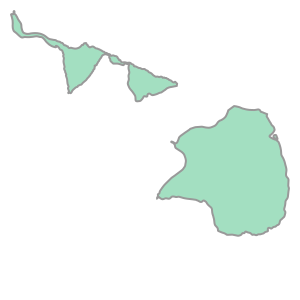

In [85]:
gdf.iloc[18].geometry

### 面積


In [86]:
gdf.sort_values("面積", ascending=False).head()

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県,周囲長,面積,円形度
418,琵琶湖,"25201,25202,25203,25204,25206,25207,25210,2521...",104,84,"POLYGON ((605277.032 3928161.205, 605267.178 3...",滋賀県,260380.963581,6.694501e+08,0.124082
204,霞ヶ浦,"08203,08205,08223,08229,08230,08303,08421,0842...",7,0,"POLYGON ((977833.975 4014213.143, 977855.670 4...",茨城県,126698.390525,1.684613e+08,0.131877
66,サロマ湖,"01552,01553,01559",20,0,"POLYGON ((1193874.153 4930819.882, 1193881.527...",北海道,100455.338462,1.534060e+08,0.191032
186,猪苗代湖,"07202,07203,07408",94,514,"POLYGON ((945978.108 4164174.656, 946011.214 4...",福島県,56584.392064,1.036205e+08,0.406689
454,中海,"31202,31204,32201,32206,32304",17,0,"POLYGON ((333144.050 3934227.859, 333180.214 3...",島根県/鳥取県,156827.157925,8.702134e+07,0.044462


In [87]:
gdf.sort_values("面積", ascending=True).head()

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県,周囲長,面積,円形度
125,青池（十二湖）,02323,None,None,"POLYGON ((922084.677 4501902.560, 922079.611 4...",青森県,92.095888,429.156866,0.635836
390,駒鳥池,22100,0,2425,"POLYGON ((790998.332 3931960.745, 790994.210 3...",静岡県,128.613765,903.233374,0.686175
175,明月湖,06202,None,None,"POLYGON ((957323.661 4192201.033, 957332.361 4...",山形県,113.450498,977.694702,0.954554
176,明星湖,06202,None,None,"POLYGON ((956962.998 4192684.279, 956968.162 4...",山形県,158.298967,1539.256431,0.771906
147,御釜湖,03306,None,None,"POLYGON ((1011853.810 4428262.439, 1011865.565...",岩手県,168.001543,1825.634936,0.812825


### 都道府県毎の数


In [70]:
# group by "都道府県", count and sort by the number of lakes
counts = gdf.groupby("都道府県").size().sort_values(ascending=False)

# iterate the counts and print the number of lakes in each prefecture
for pref, count in counts.items():
    print(f"{pref}:\t{count}")

北海道:	107
長野県:	44
青森県:	35
岐阜県:	21
群馬県:	19
山口県:	16
静岡県:	16
福島県:	15
山梨県:	14
栃木県:	12
兵庫県:	12
新潟県:	12
宮城県:	11
広島県:	11
山形県:	11
岩手県:	11
千葉県:	10
埼玉県:	9
茨城県:	9
秋田県:	9
福井県:	9
岡山県:	8
三重県:	8
神奈川県:	8
奈良県:	8
愛媛県:	8
石川県:	7
沖縄県:	7
滋賀県:	6
京都府:	6
高知県:	6
鹿児島県:	6
宮崎県:	6
愛知県:	5
鳥取県:	5
大分県:	5
島根県:	5
熊本県:	4
福岡県:	3
香川県:	3
和歌山県:	2
福島県/新潟県:	2
富山県:	2
広島県/山口県:	2
熊本県/大分県:	2
島根県/鳥取県:	2
茨城県/千葉県:	1
徳島県:	1
佐賀県:	1
東京都:	1
広島県/岡山県:	1
和歌山県/三重県/奈良県:	1
埼玉県/群馬県:	1
長崎県:	1
石川県/福井県:	1
岐阜県/富山県:	1
大阪府/兵庫県:	1
秋田県/青森県:	1
福島県/群馬県:	1
愛知県/静岡県:	1
石川県/富山県:	1
山梨県/東京都:	1
愛知県/岐阜県:	1


### 丸さ


In [73]:
gdf["円形度"] = 4 * math.pi * gdf["面積"] / (gdf["周囲長"] ** 2)

In [74]:
gdf

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県,周囲長,面積,円形度
0,さっぽろ湖,01100,None,None,"POLYGON ((1001989.090 4778014.420, 1001986.243...",北海道,17266.599491,1.784306e+06,0.075208
1,定山湖,01100,None,None,"POLYGON ((1001796.797 4768236.691, 1001796.494...",北海道,12675.560584,1.415566e+06,0.110715
2,オタルナイ湖,01203,None,None,"POLYGON ((991624.057 4793407.236, 991626.680 4...",北海道,3098.593932,2.998003e+05,0.392385
3,春採湖,01206,None,None,"POLYGON ((1267613.496 4801427.797, 1267613.309...",北海道,4510.042551,3.485092e+05,0.215309
4,富里湖,01208,None,None,"POLYGON ((1202955.207 4893685.089, 1202959.210...",北海道,3253.300842,1.978890e+05,0.234954
...,...,...,...,...,...,...,...,...,...
551,フンガー湖,47301,None,None,"POLYGON ((-169172.846 2976897.207, -169177.757...",沖縄県,6839.734068,1.368298e+05,0.036755
552,伊集の湖,47301,None,None,"POLYGON ((-170469.119 2981102.327, -170467.123...",沖縄県,13876.185298,2.817393e+05,0.018387
553,福上湖,47303,None,None,"POLYGON ((-174919.821 2966740.620, -174915.221...",沖縄県,46528.487906,2.214969e+06,0.012857
554,新川湖,47303,None,None,"POLYGON ((-173601.971 2970251.071, -173595.623...",沖縄県,5343.803670,1.066351e+05,0.046926


In [75]:
gdf.sort_values("円形度", ascending=False)

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県,周囲長,面積,円形度
175,明月湖,06202,None,None,"POLYGON ((957323.661 4192201.033, 957332.361 4...",山形県,113.450498,9.776947e+02,0.954554
69,倶多楽湖,01578,148,258,"POLYGON ((1007798.371 4725032.690, 1007800.111...",北海道,7914.240329,4.712454e+06,0.945450
80,東雲湖（東小沼）,01633,None,None,"POLYGON ((1160406.870 4822942.190, 1160409.546...",北海道,812.935835,4.838713e+04,0.920083
314,四尾連湖,19343,None,None,"POLYGON ((819005.425 3937582.488, 819010.092 3...",山梨県,967.101981,6.753465e+04,0.907386
362,巣鷹湖,20563,None,None,"POLYGON ((810992.763 4091261.346, 810980.150 4...",長野県,633.505109,2.880701e+04,0.902002
...,...,...,...,...,...,...,...,...,...
552,伊集の湖,47301,None,None,"POLYGON ((-170469.119 2981102.327, -170467.123...",沖縄県,13876.185298,2.817393e+05,0.018387
42,朱鞠内湖,01439,0,282,"POLYGON ((1074860.532 4938207.814, 1074862.224...",北海道,122831.775969,2.189462e+07,0.018236
206,菅生沼,"08211,08228",0,9,"MULTIPOLYGON (((942452.933 3998788.874, 942458...",茨城県,21136.182357,5.335258e+05,0.015008
553,福上湖,47303,None,None,"POLYGON ((-174919.821 2966740.620, -174915.221...",沖縄県,46528.487906,2.214969e+06,0.012857


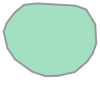

In [78]:
# 名月湖
gdf.iloc[175].geometry

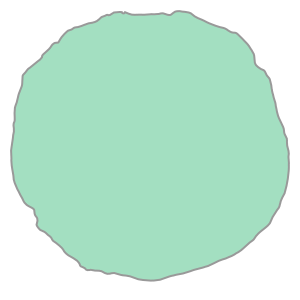

In [80]:
# 倶多楽湖
gdf.iloc[69].geometry

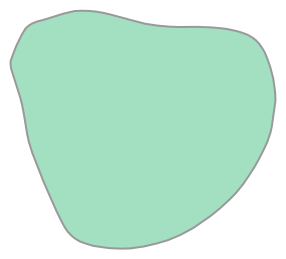

In [101]:
# 東雲湖（東小沼）
gdf.iloc[80].geometry

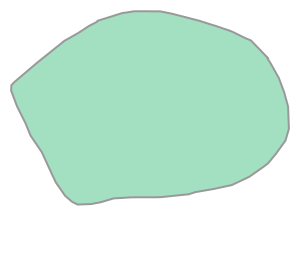

In [103]:
# 四尾連湖
gdf.iloc[314].geometry

In [ ]:
gdf.sort_values("円形度", ascending=True)

,湖沼名,行政区域コード,最大水深,水面標高,geometry,都道府県,周囲長,面積,円形度
538,野尻湖,"45345,45361,45362",0,130,"POLYGON ((132801.338 3542378.095, 132787.526 3...",宮崎県,57759.890301,1.982224e+06,0.007466
553,福上湖,47303,None,None,"POLYGON ((-174919.821 2966740.620, -174915.221...",沖縄県,46528.487906,2.214969e+06,0.012857
206,菅生沼,"08211,08228",0,9,"MULTIPOLYGON (((942452.933 3998788.874, 942458...",茨城県,21136.182357,5.335258e+05,0.015008
42,朱鞠内湖,01439,0,282,"POLYGON ((1074860.532 4938207.814, 1074862.224...",北海道,122831.775969,2.189462e+07,0.018236
552,伊集の湖,47301,None,None,"POLYGON ((-170469.119 2981102.327, -170467.123...",沖縄県,13876.185298,2.817393e+05,0.018387
...,...,...,...,...,...,...,...,...,...
362,巣鷹湖,20563,None,None,"POLYGON ((810992.763 4091261.346, 810980.150 4...",長野県,633.505109,2.880701e+04,0.902002
314,四尾連湖,19343,None,None,"POLYGON ((819005.425 3937582.488, 819010.092 3...",山梨県,967.101981,6.753465e+04,0.907386
80,東雲湖（東小沼）,01633,None,None,"POLYGON ((1160406.870 4822942.190, 1160409.546...",北海道,812.935835,4.838713e+04,0.920083
69,倶多楽湖,01578,148,258,"POLYGON ((1007798.371 4725032.690, 1007800.111...",北海道,7914.240329,4.712454e+06,0.945450


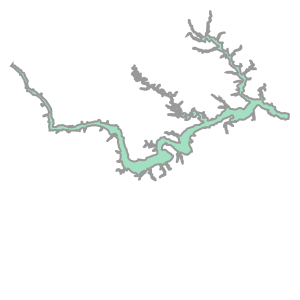

In [98]:
gdf.iloc[538].geometry  # 野尻湖（宮崎県）

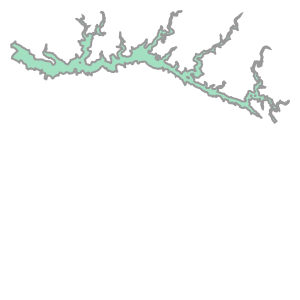

In [100]:
gdf.iloc[553].geometry  # 福上湖

In [96]:
# altair: scatter plot: x="面積", y="周囲長"
alt.Chart(gdf).mark_circle().encode(
    x="面積",
    #     x=alt.X("面積").scale(type="log"),
    y="円形度",
    tooltip=[
        "湖沼名",
        "都道府県",
        "面積",
        "周囲長",
        "円形度",
    ],
).interactive()

alt.Chart(...)